# Initial Data Exploration

Initial data exploration for the project '**Aftershock pattern prediction based on earthquake rupture data for improved seismic hazard assessment**' (pred_seism_aftXYZ). DeVries18 will refer to the article 'Deep learning of aftershock patterns following large earthquakes' by Phoebe M. R. DeVries, Fernanda Viégas, Martin Wattenberg & Brendan J. Meade, and published in Nature in 2018 (https://www.nature.com/articles/s41586-018-0438-y ).

## Data source

### Finite-Source Rupture Model Database

Import the original mainshock rupture SRCMOD data files from the project's GitHub repository https://github.com/amignan/pred_seism_aftXYZ (we first retrieved the same 199 SRCMOD.fsp files as used in DeVries18 from http://equake-rc.info/SRCMOD/searchmodels/allevents/ ).

In [3]:
#!git clone https://github.com/amignan/pred_seism_aftXYZ/

Cloning into 'pred_seism_aftXYZ'...
remote: Enumerating objects: 226, done.
remote: Counting objects: 100% (226/226), done.
remote: Compressing objects: 100% (204/204), done.
remote: Total 226 (delta 24), reused 222 (delta 20), pack-reused 0
Receiving objects: 100% (226/226), 1.79 MiB | 0 bytes/s, done.
Resolving deltas: 100% (24/24), done.


In [5]:
SRCMOD_dir = 'pred_seism_aftXYZ/datasets/SRCMOD/'
!ls pred_seism_aftXYZ/datasets/SRCMOD/

s1968HYUGAx01YAGI.fsp  s1997KAGOSH01HORI.fsp  s2007TOCOPI01SLAD.fsp
s1968TOKACH01NAGA.fsp  s1997KAGOSH01MIYA.fsp  s2007TOCOPI01ZENG.fsp
s1969GIFUxK01TAKE.fsp  s1997KAGOSH02HORI.fsp  s2007TOCOPI02BEJA.fsp
s1971SANFER01HEAT.fsp  s1997ZIRKUH01SUDH.fsp  s2007TOCOPI03BEJA.fsp
s1974IZUxHA01TAKE.fsp  s1998HIDASW05IDEx.fsp  s2008IWATEx01HAYE.fsp
s1974PERUCE01HART.fsp  s1998HIDASW07IDEx.fsp  s2008KERMED01HAYE.fsp
s1978MIYAGI01YAMA.fsp  s1998HIDASW09IDEx.fsp  s2008SIMEUL01HAYE.fsp
s1978TABASI01HART.fsp  s1998HIDASW11IDEx.fsp  s2008SIMEUL01SLAD.fsp
s1979COYOTE01LIUx.fsp  s1998IWATEJ01MIYA.fsp  s2008SULAWE01SLAD.fsp
s1979IMPERI01ARCH.fsp  s1998IWATEJ01NAKA.fsp  s2008WENCHU01JIxx.fsp
s1979IMPERI01HART.fsp  s1999CHICHI01CHIx.fsp  s2008WENCHU01SLAD.fsp
s1979IMPERI01OLSO.fsp  s1999CHICHI01JOHN.fsp  s2008WENCHU01YAGI.fsp
s1979PETATL01MEND.fsp  s1999CHICHI01MAxx.fsp  s2008WENCHU02FIEL.fsp
s1980IZUxHA01TAKE.fsp  s1999CHICHI01SEKI.fsp  s2008WENCHU03FIEL.fsp
s1981PLAYAA01MEND.fsp  s1999CHICHI01WUxx.fsp  s2

In [6]:
import os
import fnmatch

file_list = fnmatch.filter(os.listdir(SRCMOD_dir), '*.fsp')
file_list.sort()
len(file_list)

199

Check the format of one of the SCRMOD files (should be the same as described at http://equake-rc.info/SRCMOD/fileformats/fsp/ ).

In [7]:
with open(SRCMOD_dir + file_list[0]) as file0:
    line = file0.readline()
    while line:
        print(line.strip())
        line = file0.readline()

% ----------------------------------  FINITE-SOURCE RUPTURE MODEL  --------------------------------
%
% Event : Hyuga-nada (Japan) 		04/01/1968 		[Yagi et al. (1998) ]
% EventTAG: s1968HYUGAx01YAGI
%
% Loc  : LAT  = 32.28 		LON = 132.53		DEP = 15.0
% Size : LEN  = 72.0 km 	WID =  63.0 km		Mw = 7.53	Mo = 2.22e+20 Nm
% Mech : STRK = 227.0		DIP = 12.0		RAKE = 90.0	Htop = 10.32 km
% Rupt : HypX = 31.50 km 	HypZ = 22.50 km 		avTr = 12.0 s	avVr = 2.8 km/s
%
% ----------------------------------  inversion-related parameters  --------------------------------
%
% Invs :  Nx  =  8 	Nz  = 7 	Fmin = 999.00 Hz 	Fmax = 999.00 Hz
% Invs :  Dx  =  9.00 km 	Dz  = 9.00 km
% Invs :  Ntw =  1	Nsg =  1 			(# of time-windows,# of fault segments)
% Invs :  LEN =  999.0 s	SHF =  0.0 s 		(time-window length and time-shift)
% SVF  :  unknown 					(type of slip-velocity function used)
%
% Data : 	SGM	TELE	TRIL	LEVEL	GPS	INSAR	SURF	OTHER
% Data : 	999	0	0	0	0	0	0	0
% PHImx: 	999	0	0	0	0	0	0	0
% Rmin : 	999	0	0	0	

### DeVries18 Deep Learning Model Input

Import the DeVries18 model inputs via the 'LabelledDataset_DeVries18.pkl' pickle file (we first downloaded all labelled samples per mainshock rupture model, in csv format, from the DeVries18 Google Drive https://drive.google.com/drive/folders/1c5Rb_6EsuP2XedDjg37bFDyf8AadtGDa. This link is given in the README.md of https://github.com/phoebemrdevries/Learning-aftershock-location-patterns - we then pickled the concatenated data frame where the column ID was added, with ID = SRCMOD EventTAG; see the mk_pickle.ipynb notebook on the project's GitHub repository).

In [8]:
# @hidden_cell
# The following code contains the credentials for a file in your IBM Cloud Object Storage.
# You might want to remove those credentials before you share your notebook.
credentials = {
    'IBM_API_KEY_ID': 'XXXXX',
    'IAM_SERVICE_ID': 'XXXXX',
    'ENDPOINT': 'https://s3-api.us-geo.objectstorage.service.networklayer.com',
    'IBM_AUTH_ENDPOINT': 'https://iam.bluemix.net/oidc/token',
    'BUCKET': 'predseismaftxyz-donotdelete-pr-dfvzajzxij3spi',
    'FILE': 'LabelledDataset_DeVries18.pkl'
}

from ibm_botocore.client import Config
import ibm_boto3

#Cloud Object Storage
cos = ibm_boto3.client(service_name='s3',
    ibm_api_key_id=credentials['IBM_API_KEY_ID'],
    ibm_service_instance_id=credentials['IAM_SERVICE_ID'],
    ibm_auth_endpoint=credentials['IBM_AUTH_ENDPOINT'],
    config=Config(signature_version='oauth'),
    endpoint_url=credentials['ENDPOINT'])

In [9]:
#cos.download_file(Bucket=credentials['BUCKET'], Key='LabelledDataset_DeVries18.pkl', 
#                  Filename='LabelledDataset_DeVries18.pkl')
!ls

LabelledDataset_DeVries18.pkl  pred_seism_aftXYZ


In [10]:
import pandas as pd

df_DeVries18 = pd.read_pickle('LabelledDataset_DeVries18.pkl')
len(df_DeVries18)

6121210

In [11]:
df_DeVries18.columns

Index(['x', 'y', 'z', 'stresses_full_xx', 'stresses_full_xy',
       'stresses_full_yy', 'stresses_full_xz', 'stresses_full_yz',
       'stresses_full_zz', 'stresses_full_max_shear', 'stresses_full_cfs_1',
       'stresses_full_cfs_2', 'stresses_full_cfs_3', 'stresses_full_cfs_4',
       'von_mises', 'aftershocksyn', 'ID'],
      dtype='object')

In [12]:
df_DeVries18.head(5)

,x,y,z,stresses_full_xx,stresses_full_xy,stresses_full_yy,stresses_full_xz,stresses_full_yz,stresses_full_zz,stresses_full_max_shear,stresses_full_cfs_1,stresses_full_cfs_2,stresses_full_cfs_3,stresses_full_cfs_4,von_mises,aftershocksyn,ID
0,228050.836661,3.438285e+06,-2500.0,-2643.095958,-303.314853,-8306.190130,-62.011213,-591.513951,-23.523893,4191.904227,1278.439670,-1609.139444,1609.139444,-1278.439670,7423.266049,0.0,s1968HYUGAx01YAGI
1,233050.836661,3.438285e+06,-2500.0,-2506.143012,33.487142,-8293.837540,-40.272330,-619.872533,-25.140746,4180.998624,1353.632905,-1706.330567,1706.330567,-1353.632905,7427.854270,0.0,s1968HYUGAx01YAGI
2,238050.836661,3.438285e+06,-2500.0,-2390.411001,381.016088,-8149.157556,-16.212656,-642.672511,-26.597214,4124.540863,1417.713571,-1789.742291,1789.742291,-1417.713571,7351.107005,0.0,s1968HYUGAx01YAGI
3,243050.836661,3.438285e+06,-2500.0,-2299.362270,723.248609,-7868.650242,9.526966,-659.035520,-27.846052,4021.524131,1466.875844,-1854.619572,1854.619572,-1466.875844,7190.271468,0.0,s1968HYUGAx01YAGI
4,248050.836661,3.438285e+06,-2500.0,-2233.960345,1043.357897,-7454.950559,36.174998,-668.289344,-28.844615,3872.648486,1497.602675,-1896.565287,1896.565287,-1497.602675,6945.768984,0.0,s1968HYUGAx01YAGI


In [13]:
df_DeVries18.tail(5)

,x,y,z,stresses_full_xx,stresses_full_xy,stresses_full_yy,stresses_full_xz,stresses_full_yz,stresses_full_zz,stresses_full_max_shear,stresses_full_cfs_1,stresses_full_cfs_2,stresses_full_cfs_3,stresses_full_cfs_4,von_mises,aftershocksyn,ID
19285,471380.946671,372842.32334,-47500.0,710.070096,-5251.054285,20733.987163,3930.203536,-13850.221996,6977.127223,16310.109019,417.800762,18473.143597,-18473.143597,-417.800762,31926.296190,0.0,s2012SUMATR03HAYE
19286,476380.946671,372842.32334,-47500.0,-164.919780,-3727.184738,21334.860100,3037.909222,-14138.938807,7085.178929,16380.178960,2239.826880,17679.774101,-17679.774101,-2239.826880,32062.752645,0.0,s2012SUMATR03HAYE
19287,481380.946671,372842.32334,-47500.0,-890.077876,-2014.391626,21532.007086,2048.836758,-14190.819417,7084.631269,16293.859627,4189.875411,16435.664962,-16435.664962,-4189.875411,31881.669627,0.0,s2012SUMATR03HAYE
19288,486380.946671,372842.32334,-47500.0,-1420.487894,-172.251740,21270.116357,995.878922,-13978.127096,6964.239908,16053.195403,6190.300322,14749.045895,-14749.045895,-6190.300322,31371.023080,0.0,s2012SUMATR03HAYE
19289,491380.946671,372842.32334,-47500.0,-1722.031487,1724.807596,20512.495486,-80.883303,-13483.502892,6717.367199,15669.833137,8149.539714,12654.643049,-12654.643049,-8149.539714,30533.762672,0.0,s2012SUMATR03HAYE


Visualize one labelled sample - let us consider the 1992 Landers case for one specific rupture model (event tag '1992LANDER01COHE'). We here want to reproduce an animation similar to the one shown in the following Google blog post to check the aftershock 3D pattern: https://www.blog.google/technology/ai/forecasting-earthquake-aftershock-locations-ai-assisted-science/.

In [14]:
eventTag = 's1992LANDER01COHE'

# xyz cells with or without aftershocks
loc_aft_allmainshocks = df_DeVries18[['x', 'y', 'z', 'aftershocksyn', 'ID']]
loc_aft_eventTag = loc_aft_allmainshocks.loc[(loc_aft_allmainshocks['ID'] == eventTag) 
                                             & (loc_aft_allmainshocks['aftershocksyn'] == 1)]

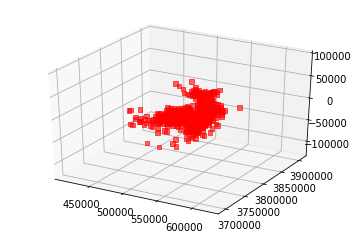

In [17]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

x = loc_aft_eventTag['x']
y = loc_aft_eventTag['y']
z = loc_aft_eventTag['z']

fig = plt.figure()
ax = fig.gca(projection='3d')
#ax.set_aspect('equal')
#ax.auto_scale_xyz([min(x), max(x)], [min(y), max(y)], [min(z), max(z)])

max_range = np.array([x.max()-x.min(), y.max()-y.min(), z.max()-z.min()]).max() / 2.0
mid_x = (x.max()+x.min()) * 0.5
mid_y = (y.max()+y.min()) * 0.5
mid_z = (z.max()+z.min()) * 0.5
ax.set_xlim(mid_x - max_range, mid_x + max_range)
ax.set_ylim(mid_y - max_range, mid_y + max_range)
ax.set_zlim(mid_z - max_range, mid_z + max_range)

def init():
    ax.scatter(x, y, z, marker='s', s=20, c="red", alpha=0.6)
    return fig,

def animate(i):
    ax.view_init(elev=30., azim=i)
    return fig,

# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=360, interval=45, blit=True)

In [21]:
#HTML(anim.to_html5_video())
HTML(anim.to_jshtml())